# Predicting Customer Age with Computer Vision

## Introduction

The supermarket chain Good Seed is introducing a computer vision system for processing customer photos. Specifically, they are introducing cameras in the checkout area which are triggered when a customer is buying alcohol. The model will be used to predict the customer's age as part of the age verification process for legal alcohol purchases. 

Our task is to build and evaluate a model that can verify a customer's age using the mean squared error as our loss metric.

## Initialization

In [1]:
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam

## Load Data

In [2]:
def load_labels_and_path():
    try: # From TripTen Hub
        labels_df = pd.read_csv('/datasets/faces/labels.csv')
        faces_dir = '/datasets/faces/'
    except:
        try: # From Local
            labels_df = pd.read_csv('faces/labels.csv')
            faces_dir = 'faces/'
        except: # From Google Drive
            labels_df = pd.read_csv('/content/drive/MyDrive/project/faces/labels.csv')
            faces_dir = '/content/drive/MyDrive/project/faces/'

    return labels_df, faces_dir

labels_df, path = load_labels_and_path()

print(f'Faces Directory: "{path}"')
labels_df.info()
print()
display(labels_df.head())

Faces Directory: "faces/"
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7591 entries, 0 to 7590
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  7591 non-null   object
 1   real_age   7591 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 118.7+ KB



,file_name,real_age
0,000000.jpg,4
1,000001.jpg,18
2,000002.jpg,80
3,000003.jpg,50
4,000004.jpg,17


In [3]:
# Create Data Generator

datagen = ImageDataGenerator(rescale=1./255)

datagen_flow = datagen.flow_from_dataframe(
    # Folder with the data set
    directory= path + 'final_files/',
    # Define dataframe
    dataframe=labels_df,
    x_col='file_name',
    y_col='real_age',
    class_mode='raw',
    # Resize images
    image_size=(64, 64),
    batch_size=32
)

Found 7591 validated image filenames.


## EDA

In [4]:
# Describe the data
print(labels_df['real_age'].describe())

count    7591.000000
mean       31.201159
std        17.145060
min         1.000000
25%        20.000000
50%        29.000000
75%        41.000000
max       100.000000
Name: real_age, dtype: float64


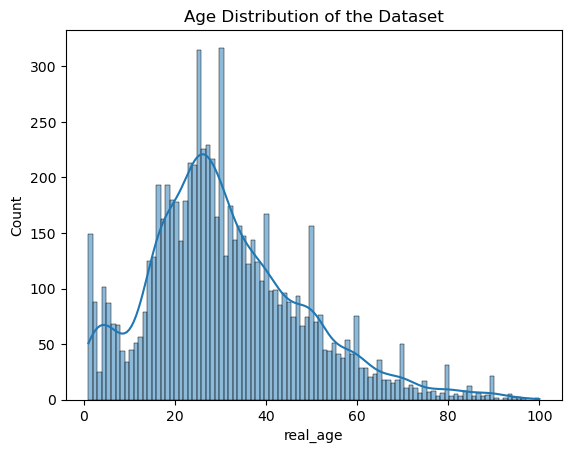

In [5]:
# Plot the distribution of ages
sns.histplot(labels_df['real_age'], bins=100, kde=True)
plt.title('Age Distribution of the Dataset')
plt.show()

In [6]:
def explore_images(directory, std_threshold=4, random_state=12345):
    file_names = []
    image_sizes =[]

    for file_name in os.listdir(directory):
        # Skip hidden files
        if file_name.startswith('.'):
            continue

        path = os.path.join(directory, file_name)

        # Open the image
        with Image.open(path) as img:
            # Get the image size
            size = img.size

        # Update the lists
        file_names.append(file_name)
        image_sizes.append(size)

    # Check if file sizes are all the same
    if len(set(image_sizes)) == 1:
        print(f"All images have the same size: {image_sizes[0]}")

    else:
        print("Images have different sizes.\nChecking if the difference is significant.")

        df = pd.DataFrame({"file_name": file_names, "image_size": image_sizes})

        # For each row in image_size, calculate the difference between the height and width
        df['diff'] = df['image_size'].apply(lambda x: np.abs(x[0] - x[1]))

        threshold = round(df['diff'].mean() + std_threshold * df['diff'].std()) # std_threshold standard deviations
        print(f"The pixel difference threshold is set to {threshold}")
        extreme_differences = df[df['diff'] > threshold]

        print(f"Found {extreme_differences.shape[0]} images with significant differences, or {extreme_differences.shape[0]/df.shape[0]:.2%}")

        # Get ten random file names from the extreme differences dataframe
        example_file_names = extreme_differences.sample(10, random_state=random_state)['file_name'].values

        # Open each image side by side with the original and print the file name
        for file_name in example_file_names:
            with Image.open(os.path.join(directory, file_name)) as img:
                print(file_name)
                fig, ax = plt.subplots(1, 2, figsize=(10, 5))
                ax[0].imshow(img)
                ax[0].set_title("Original")

                img = img.resize((224, 224))
                ax[1].imshow(img)
                ax[1].set_title("Resized")

                plt.show()

In [7]:
def show_sample_images(age_ranges, samples_per_range=3, random_state=12345):
    for age_range in age_ranges:
        print(f"Age Range: {age_range}")
        sample_df = labels_df[(labels_df['real_age'] >= age_range[0]) & (labels_df['real_age'] < age_range[1])]
        sample_df = sample_df.sample(samples_per_range, random_state=random_state)

        for i, row in sample_df.iterrows():
            with Image.open(os.path.join(path+'final_files/', row['file_name'])) as img:
                plt.imshow(img)
                plt.title(f"Age: {row['real_age']}")
                plt.axis('off')
                plt.show()

Age Range: (0, 18)


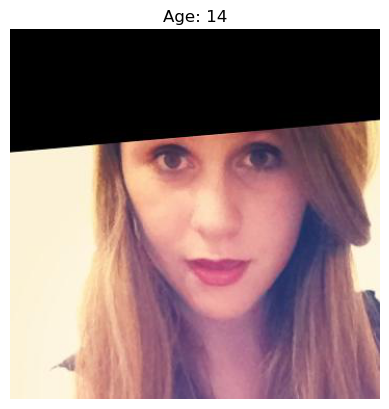

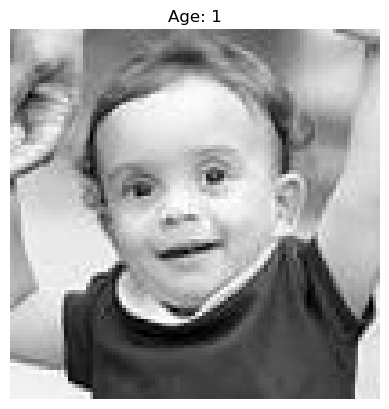

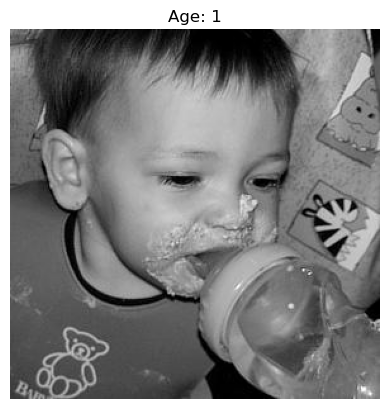

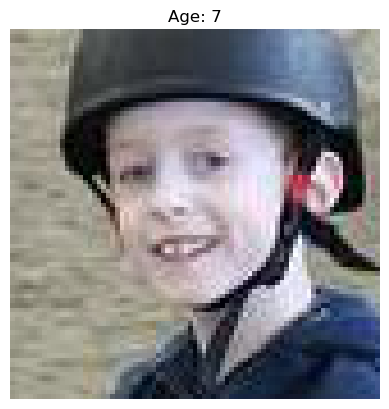

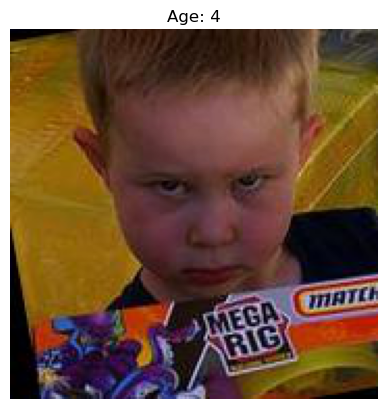

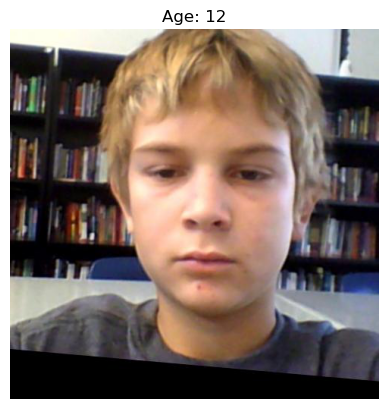

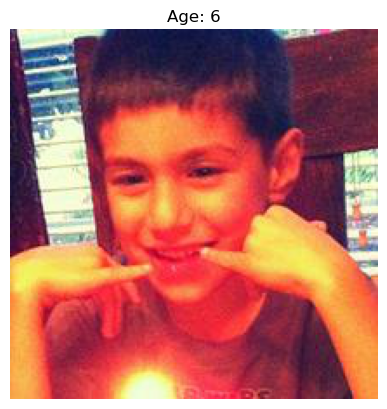

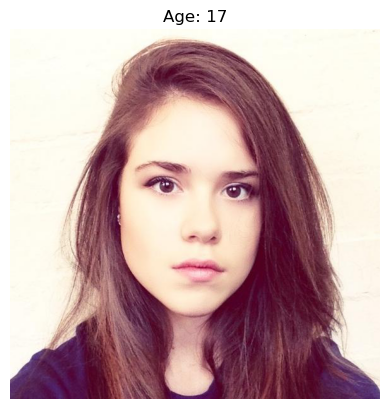

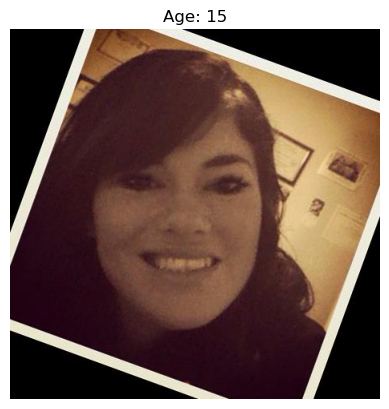

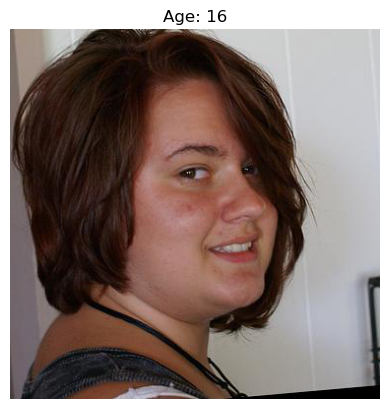

Age Range: (18, 30)


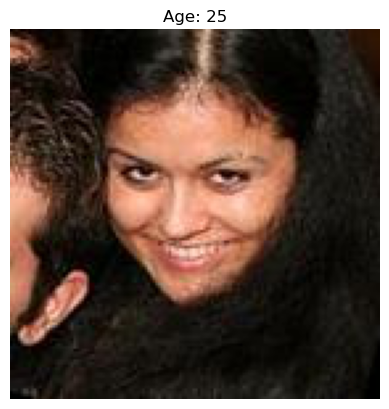

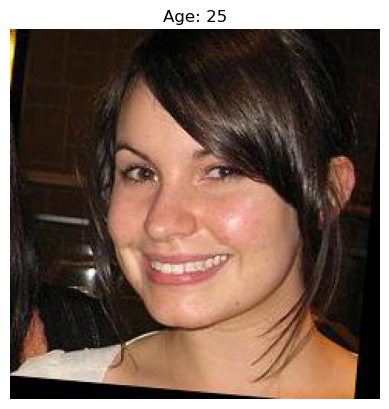

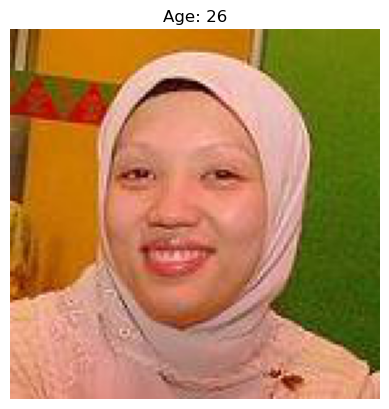

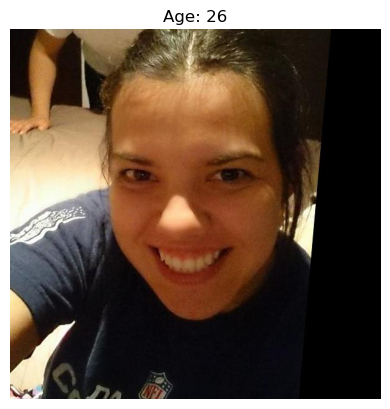

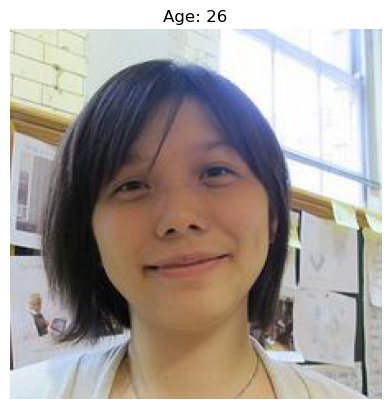

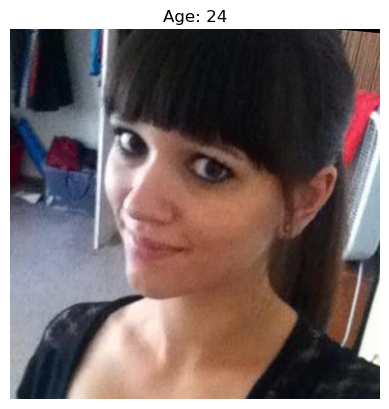

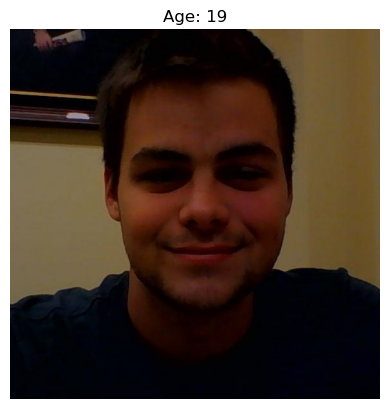

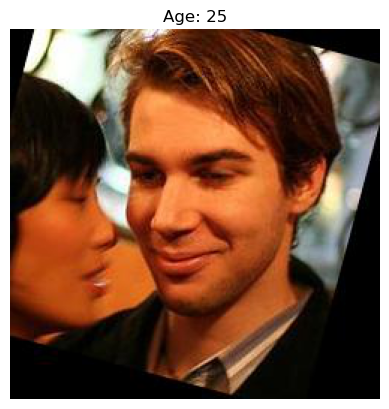

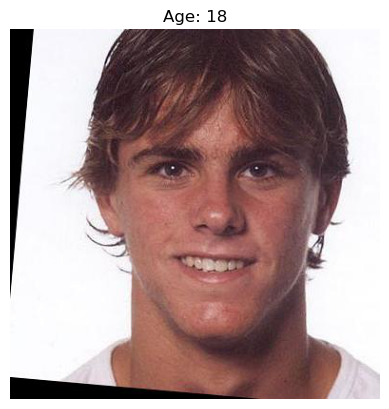

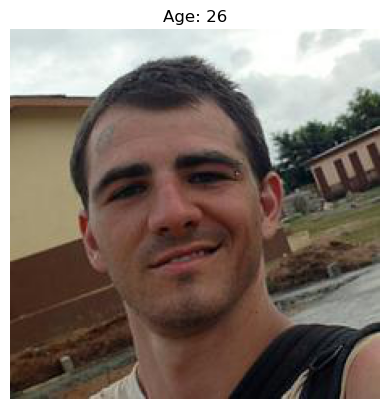

Age Range: (30, 45)


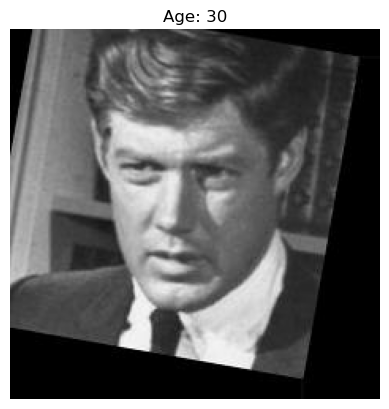

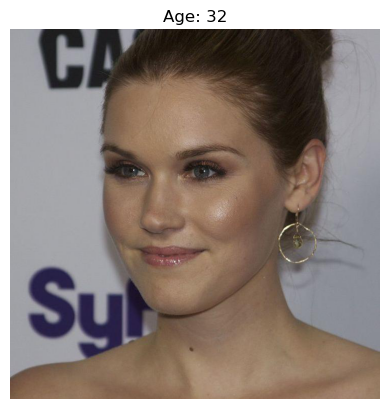

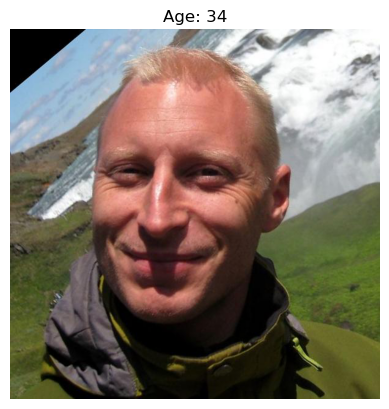

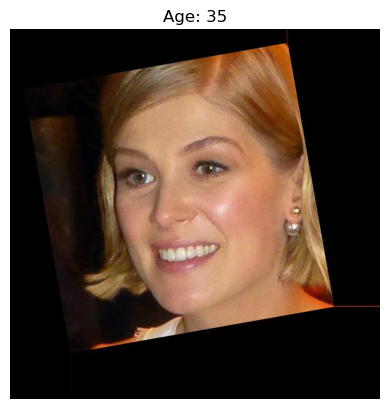

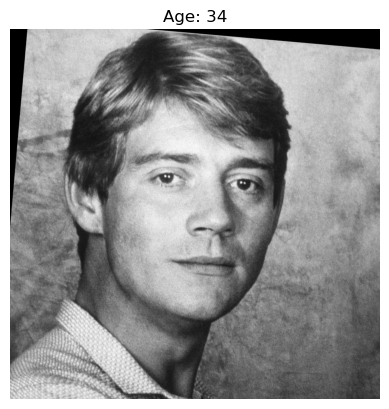

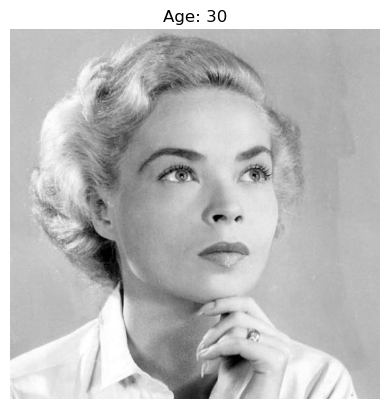

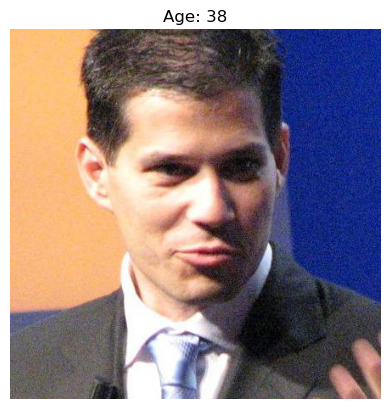

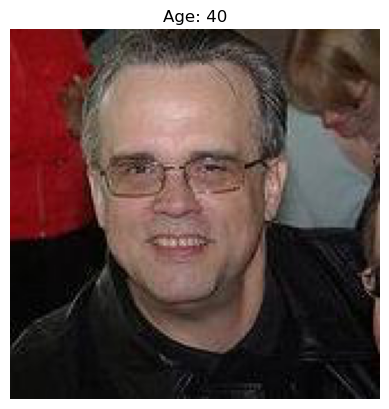

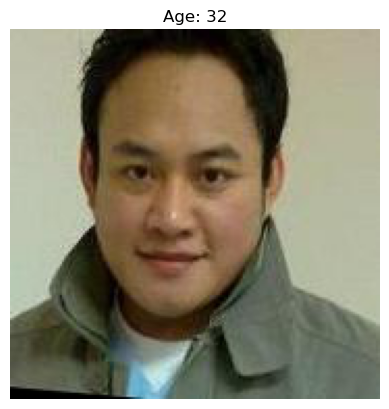

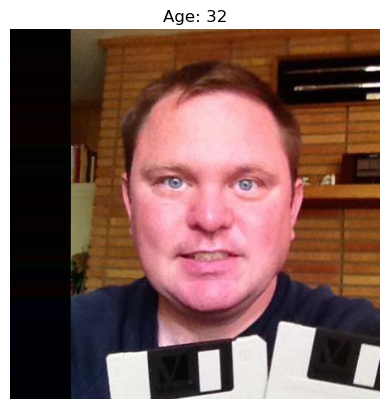

Age Range: (45, 60)


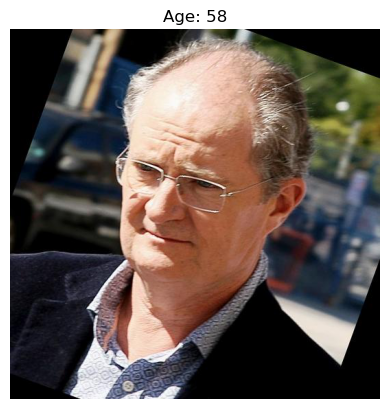

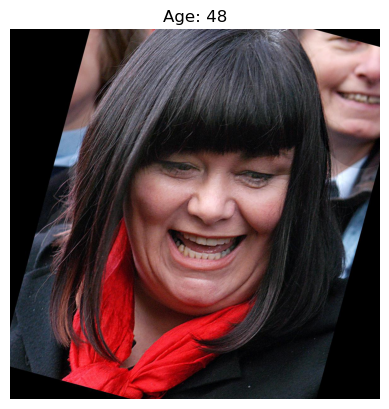

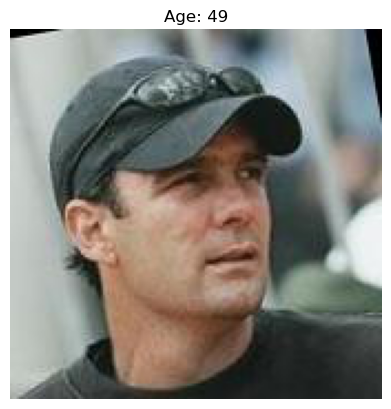

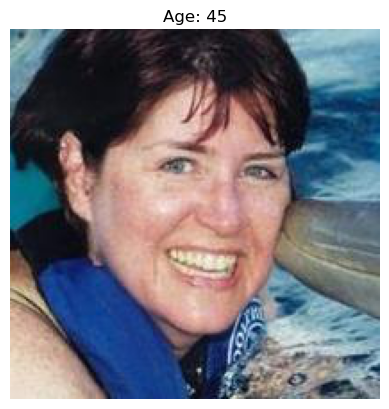

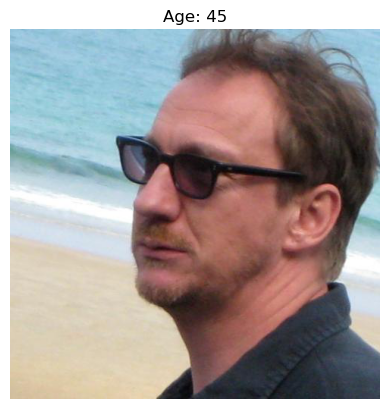

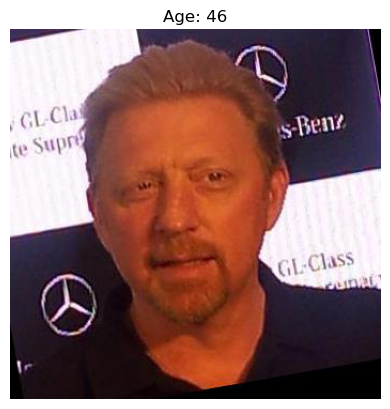

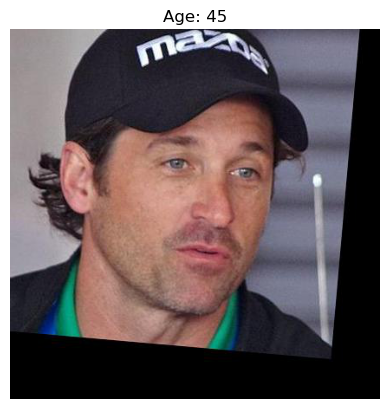

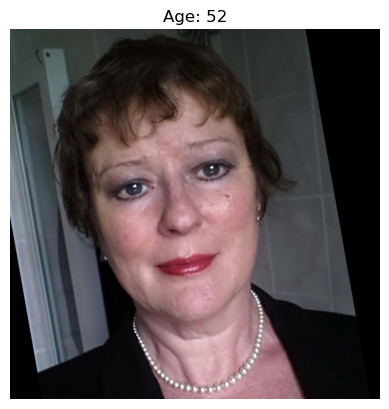

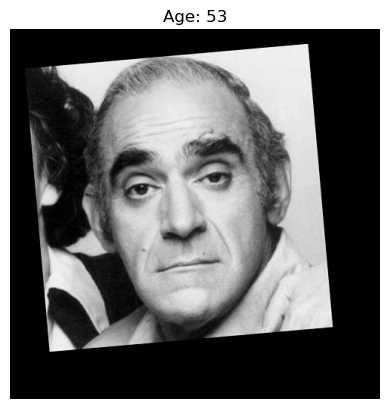

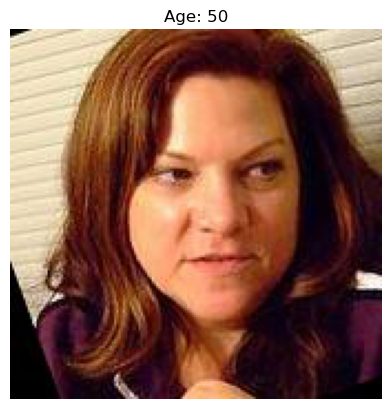

Age Range: (60, 100)


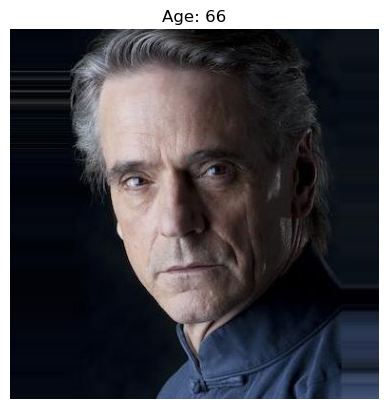

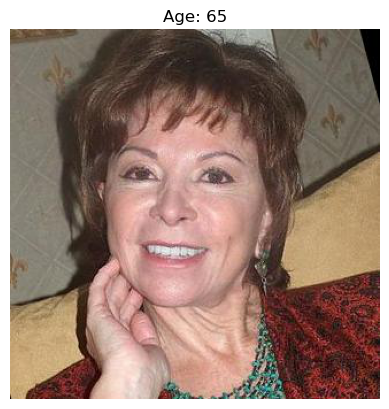

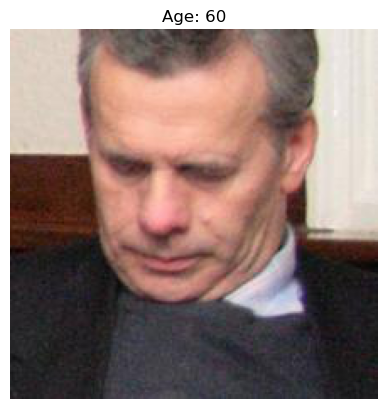

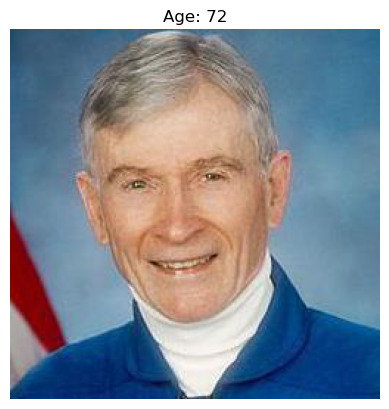

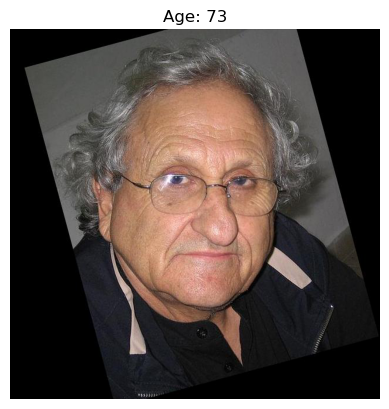

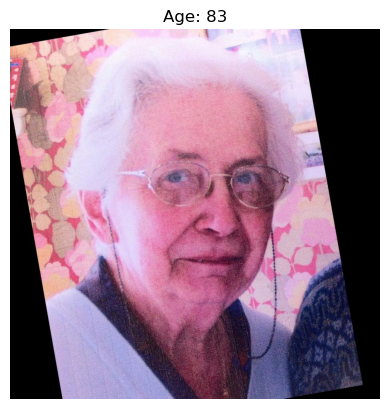

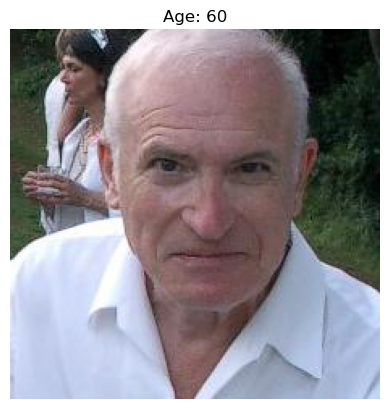

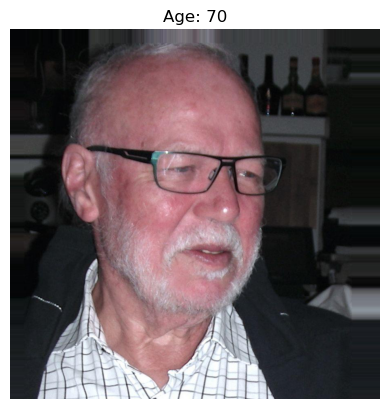

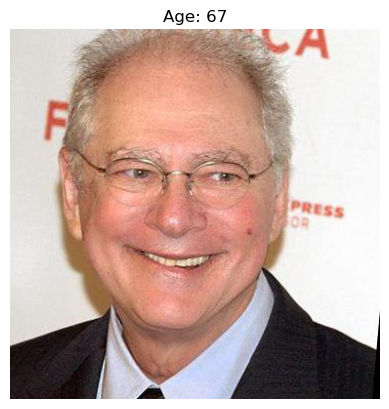

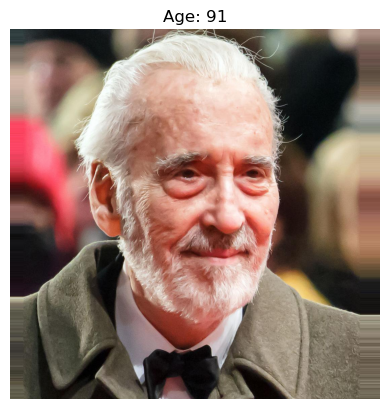

In [8]:
age_ranges = [(0, 18), (18, 30), (30, 45), (45, 60), (60, 100)]

show_sample_images(age_ranges, samples_per_range=10)

Images have different sizes.
Checking if the difference is significant.
The pixel difference threshold is set to 196
Found 110 images with significant differences, or 1.45%
002883.jpg


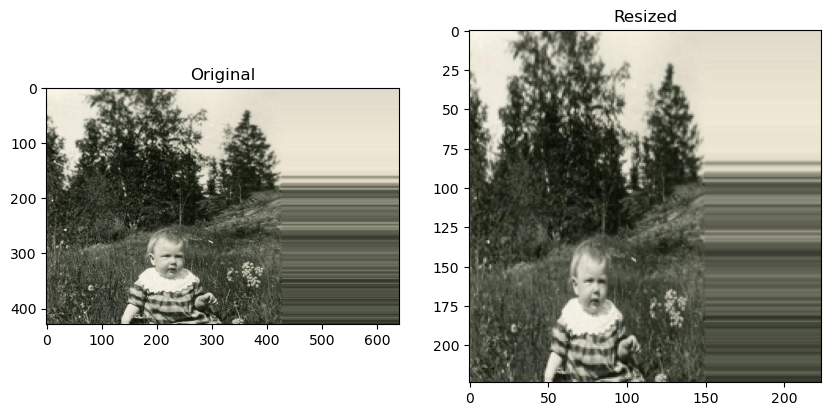

002472.jpg


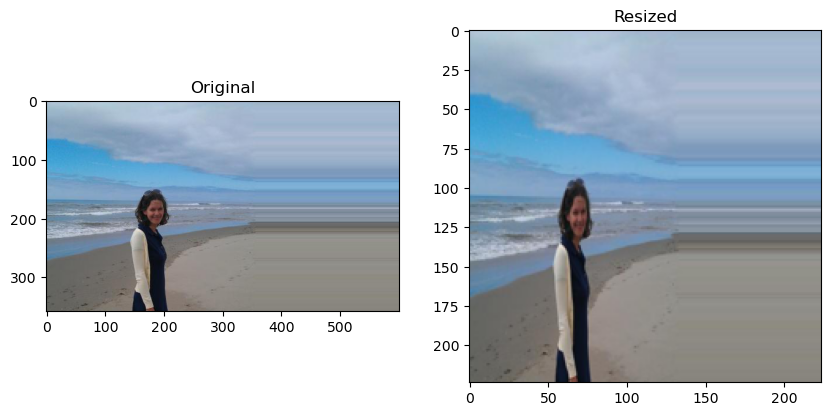

004678.jpg


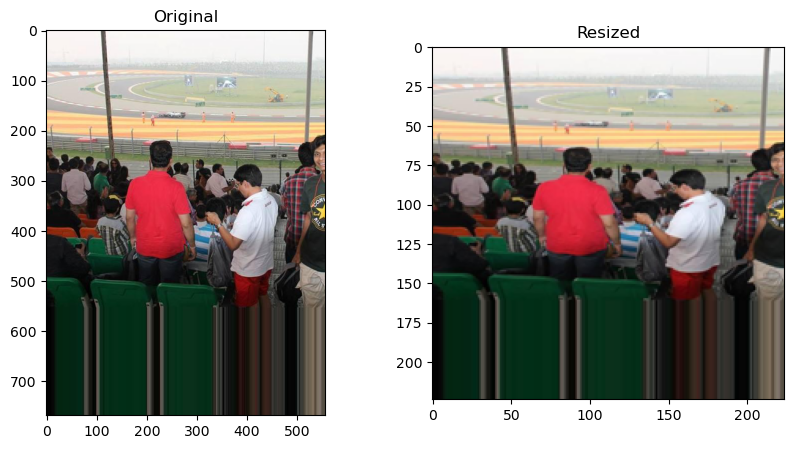

002890.jpg


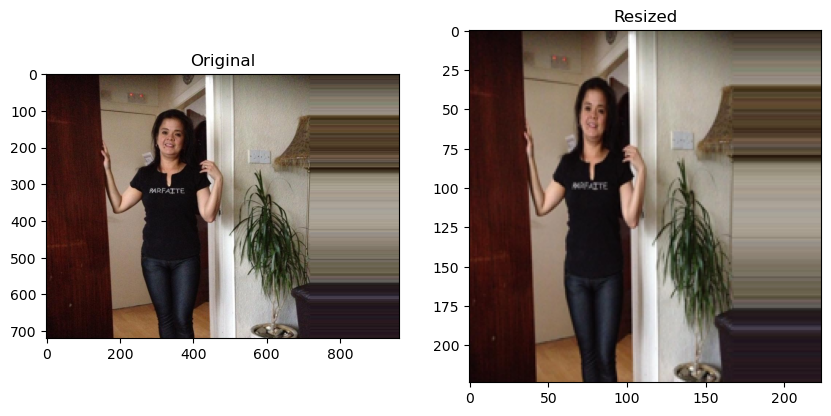

004180.jpg


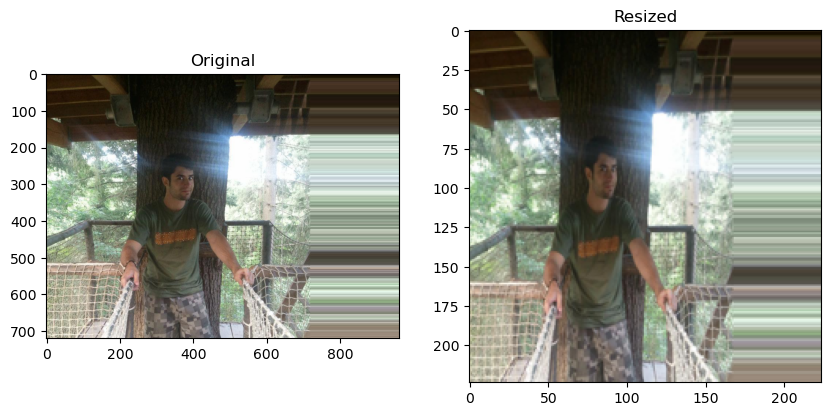

005753.jpg


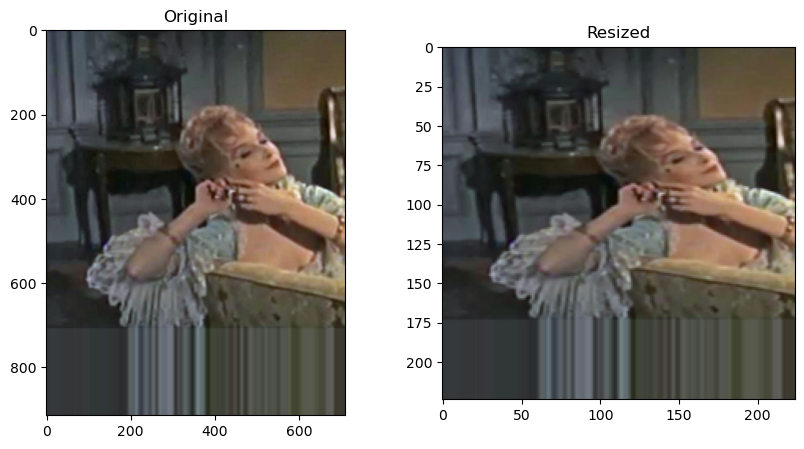

002179.jpg


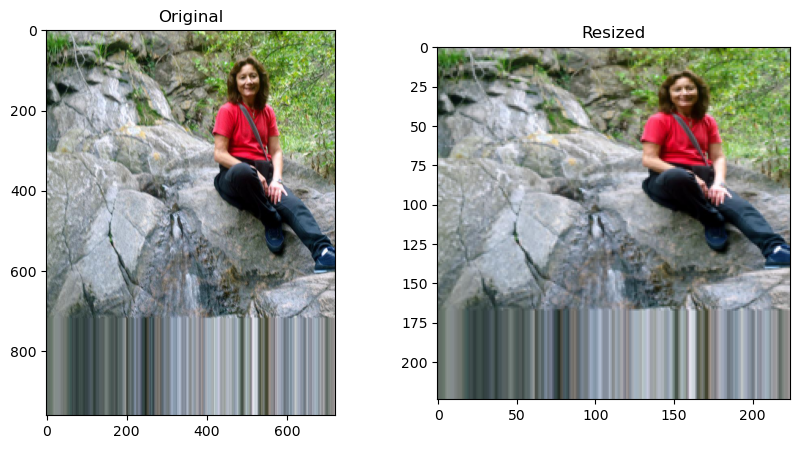

001227.jpg


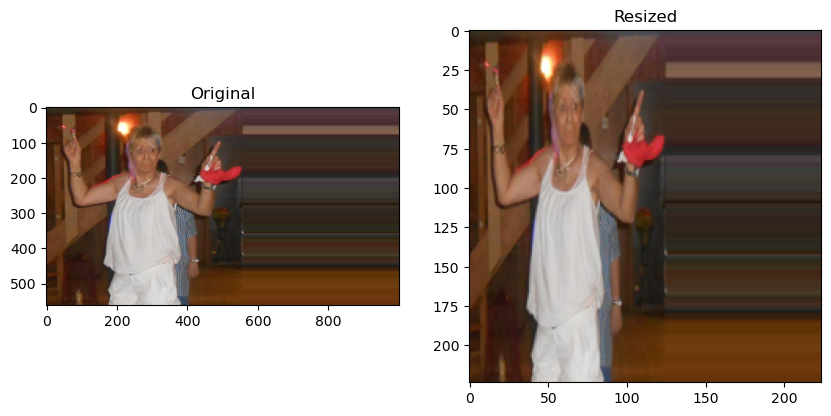

007518.jpg


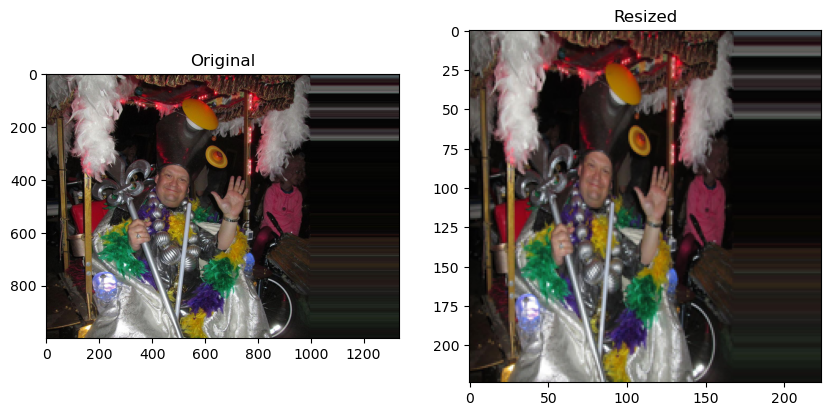

004722.jpg


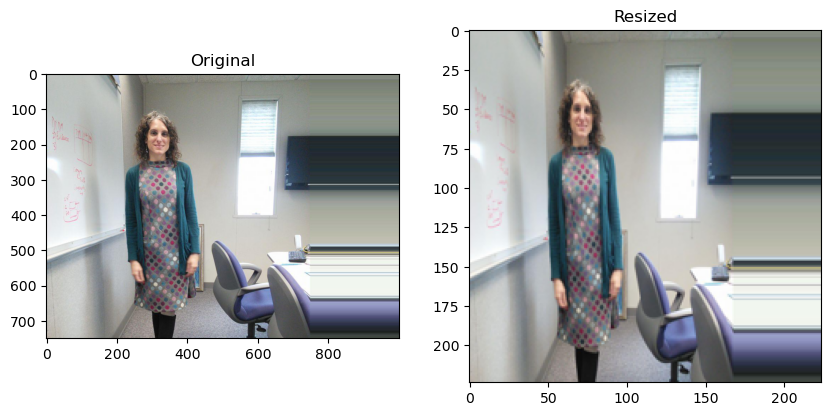

In [9]:
explore_images(path+'final_files/', std_threshold=4, random_state=12345)

### Findings

**Age Distribution:** There is good representation of ages between 14 and 40, which is good since this is the age range where you would expect the most difficulty in determining age. There is also a large representation of ages from 0 to about 6 - this age group may be unnecessary to train on considering this age group isn't even capable of working the checkout machine. It would also probably be better to have closer to equal representation for ages between ~6 years old to ~80 years old.

**Image Quality:** Based on the sample function, images appear to be of good quality and accurately labeled. However, further exploration of the photo dataset reveals that many images are not square (will be distorted on resizing), are corrupted (the right side of `002883.jpg` for example), or are not suitable for our task (`004678.jpg` as an example). Further cleaning of this dataset would be helpful.

**Potential Biases:** Based on the sampled images, it is clear there is significant under representation of non-white individuals.

## Modelling

In [10]:
def load_train(path, batch_size=32, im_dims=(64, 64)):
    """
    Loads the train part of dataset from path. Flows from dataframe.
    """
    df = pd.read_csv(path + 'labels.csv')
    train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.25)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df,
        directory=path + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=im_dims,
        batch_size=batch_size,
        class_mode='raw',
        subset='training',
        seed=12345)
    
    print(f"Train generator: {train_gen_flow}")
    print(f"Train samples: {train_gen_flow.samples}")
    print(f"Train image shape: {train_gen_flow.image_shape}")
    return train_gen_flow

In [11]:
def load_test(path, batch_size=32, im_dims=(64, 64)):
    """
    Loads the validation/test part of dataset from path. Flows from dataframe.
    """
    df = pd.read_csv(path + 'labels.csv')
    test_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.25)
    test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=df,
        directory=path + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=im_dims,
        batch_size=batch_size,
        class_mode='raw',
        subset='validation',
        seed=12345)
    
    print(f"Test generator: {test_gen_flow}")
    print(f"Test samples: {test_gen_flow.samples}")
    print(f"Test image shape: {test_gen_flow.image_shape}")
    return test_gen_flow

In [12]:
def create_model(input_shape):

    """
    Defines the model
    """

    backbone = ResNet50(weights='imagenet',
                        input_shape=input_shape,
                        include_top=False)

    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    model.add(Dense(1, activation='relu'))

    optimizer = Adam(learning_rate=0.0005)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

    return model

In [13]:
def train_model(model, train_data, test_data, epochs=20):
    """
    Trains a machine learning model using the provided training and testing data generators for a specified number of epochs.

    Parameters:
    model: The machine learning model to be trained.
    train_data: a tf.data.Dataset object containing the training data.
    test_data: a tf.data.Dataset object containing the testing data.
    epochs: (Optional) The number of epochs to train the model. Default is 20.
    
    Returns:
    model: The trained machine learning model.
    """
    import warnings

    # Ignore specific warning message
    warnings.filterwarnings('ignore', message='Your `PyDataset` class should call `super\(\).__init__\(\*\*kwargs\)` in its constructor.')

    model.fit(train_data,
              validation_data=test_data,
              epochs=epochs,
              verbose=2)

    return model

## Training

In [14]:
train_in_nb = False
if input("Do you want to train the model in this notebook? (y/n): ").lower() == 'y':
        train_in_nb = True

        print("# Test with im_dims=(224, 224) and 20 epochs #")

        # Load the train and test data
        train_data = load_train(path, im_dims=(224, 224))
        test_data = load_test(path, im_dims=(224, 224))

        # Create the model
        model = create_model(train_data.image_shape)
        # Train the model
        model = train_model(model, train_data, test_data, epochs=20)
else:
    print("Trained the model in a separate script.")


Trained the model in a separate script.


Epoch 1/20
178/178 - 159s - 894ms/step - loss: 201.0227 - mae: 10.5210 - val_loss: 299.6578 - val_mae: 12.8978

Epoch 2/20
178/178 - 61s - 344ms/step - loss: 102.7120 - mae: 7.7218 - val_loss: 372.4534 - val_mae: 14.3906

Epoch 3/20
178/178 - 82s - 462ms/step - loss: 66.2948 - mae: 6.2325 - val_loss: 365.2023 - val_mae: 14.2196

Epoch 4/20
178/178 - 62s - 348ms/step - loss: 47.8181 - mae: 5.2945 - val_loss: 193.2809 - val_mae: 10.1931

Epoch 5/20
178/178 - 62s - 348ms/step - loss: 32.6867 - mae: 4.3877 - val_loss: 107.7831 - val_mae: 8.1410

Epoch 6/20
178/178 - 61s - 341ms/step - loss: 24.2714 - mae: 3.7957 - val_loss: 91.7317 - val_mae: 7.2144

Epoch 7/20
178/178 - 62s - 348ms/step - loss: 19.2076 - mae: 3.3613 - val_loss: 79.7894 - val_mae: 6.7555

Epoch 8/20
178/178 - 82s - 463ms/step - loss: 17.9895 - mae: 3.2153 - val_loss: 94.3166 - val_mae: 7.1791

Epoch 9/20
178/178 - 62s - 348ms/step - loss: 16.2730 - mae: 3.1058 - val_loss: 85.3568 - val_mae: 6.7418

Epoch 10/20
178/178 - 61s - 344ms/step - loss: 17.1895 - mae: 3.1850 - val_loss: 84.4837 - val_mae: 6.8094

Epoch 11/20
178/178 - 83s - 465ms/step - loss: 15.7670 - mae: 3.0305 - val_loss: 84.5112 - val_mae: 6.9140

Epoch 12/20
178/178 - 82s - 459ms/step - loss: 13.4234 - mae: 2.8246 - val_loss: 83.7115 - val_mae: 7.0700

Epoch 13/20
178/178 - 62s - 349ms/step - loss: 12.7620 - mae: 2.7394 - val_loss: 106.1421 - val_mae: 7.7121

Epoch 14/20
178/178 - 83s - 464ms/step - loss: 10.7346 - mae: 2.5321 - val_loss: 87.8491 - val_mae: 7.4674

Epoch 15/20
178/178 - 62s - 347ms/step - loss: 9.8330 - mae: 2.4155 - val_loss: 73.6521 - val_mae: 6.4280

Epoch 16/20
178/178 - 92s - 519ms/step - loss: 8.9160 - mae: 2.2995 - val_loss: 73.8883 - val_mae: 6.4583

Epoch 17/20
178/178 - 72s - 402ms/step - loss: 8.4247 - mae: 2.1870 - val_loss: 77.7282 - val_mae: 6.7860

Epoch 18/20
178/178 - 61s - 345ms/step - loss: 7.8158 - mae: 2.1462 - val_loss: 74.7474 - val_mae: 6.4838

Epoch 19/20
178/178 - 82s - 463ms/step - loss: 8.0099 - mae: 2.1632 - val_loss: 112.7726 - val_mae: 8.3815

Epoch 20/20
178/178 - 63s - 351ms/step - loss: 9.4347 - mae: 2.3599 - val_loss: 88.0153 - val_mae: 7.3410

## Conclusions

The training results indicate that the model's performance improves significantly over the 20 epochs. Initially, the training loss (mean squared error) starts at 201.0227 with a mean absolute error (mae) of 10.5210. By the final epoch, the training loss reduces to 9.4347, and the mae decreases to 2.3599, indicating that the model is learning effectively. However, the validation loss and mae do not show a consistent downward trend, starting from 299.6578 and 12.8978, respectively, and ending at 88.0153 and 7.3410. This suggests that while the model is improving on the training data, the performance on the validation set shows variability, indicating potential overfitting or data-related issues.

### Possible Approaches for Improvement

- Additional cleaning of the photo dataset to address scaling / image corruption issues, images suitable to this task (is it really a photo capturing someone's face), and diversity.  
- Implement early stopping to monitor the validation loss and stop training when it no longer improves.  
- Add regularization techniques, such as dropout or L2 regularization, to prevent overfitting.
- Further increase the diversity of the training data through data augmentation techniques.
- Experiment with learning rate schedules or adaptive learning rates to optimize training.